In [1]:
import tensorflow as tf 
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import pandas as pd
import os 
import cv2

# File paths for Images

In [2]:
train_data_path = 'C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//data//ninjacart_data//ninjacart_data//train'
test_data_path = 'C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//data//ninjacart_data//ninjacart_data//test'

In [3]:
os.listdir(train_data_path)

['indian market', 'onion', 'potato', 'tomato']

# Training image data count check

In [4]:
train_image_count_check = {}
for value in os.listdir(train_data_path):
    tmp_path = train_data_path+"//"+str(value)
    train_image_count_check[str(value)] = len(os.listdir(tmp_path))
train_image_count_check

{'indian market': 599, 'onion': 849, 'potato': 898, 'tomato': 789}

# Testing image data count check

In [5]:
test_image_count_check = {}
for value in os.listdir(test_data_path):
    tmp_path = test_data_path+"//"+str(value)
    test_image_count_check[str(value)] = len(os.listdir(tmp_path))
test_image_count_check

{'indian market': 81, 'onion': 83, 'potato': 81, 'tomato': 106}

# Ploting Images from Training Folder

In [6]:
def plot_images(path,label,title):
    data = path+"//"+label
    first_four_images = os.listdir(data)[:4]
    fig, axs = plt.subplots(2,2, figsize=(8,8))
    for img,ax in enumerate(axs.flat):
        img_path = data+"//"+first_four_images[img]
        image = plt.imread(img_path)
        ax.set_title(image.shape)
        ax.imshow(image)
    fig.suptitle(title)
    plt.show()



In [7]:
os.listdir(train_data_path+"//"+'indian market')[-1:-4:-1]

['village-market-827122__340.jpg', 'vendor-4049916__340.jpg', 'uyg.jpeg']

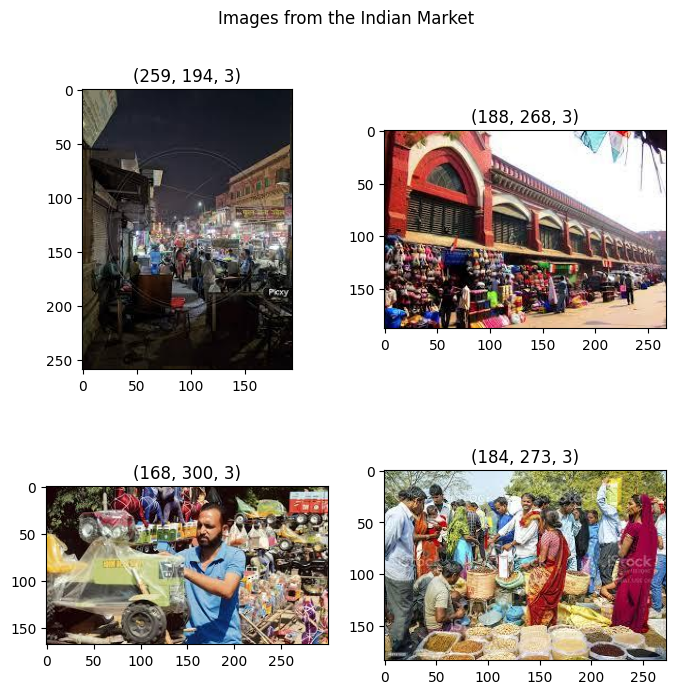

In [8]:
plot_images(train_data_path,"indian market","Images from the Indian Market")

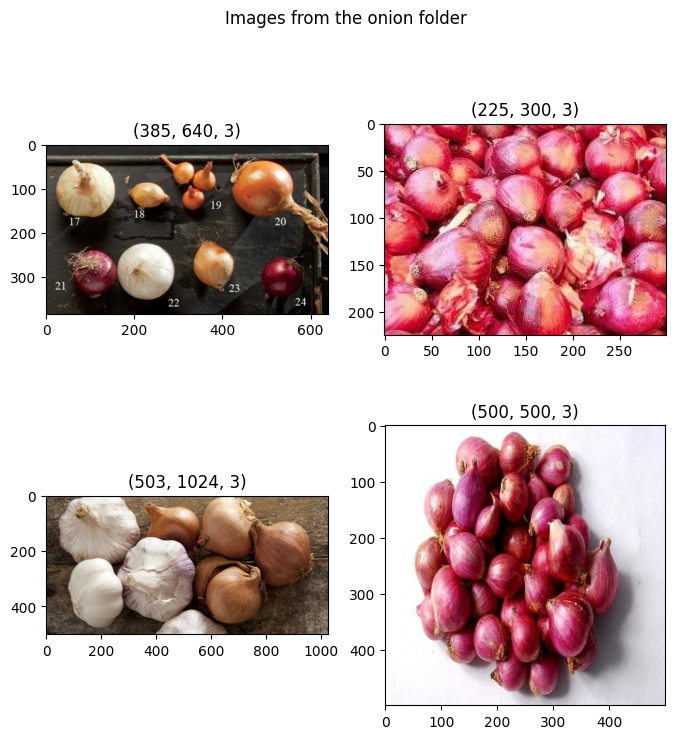

In [9]:
plot_images(train_data_path,"onion","Images from the onion folder")

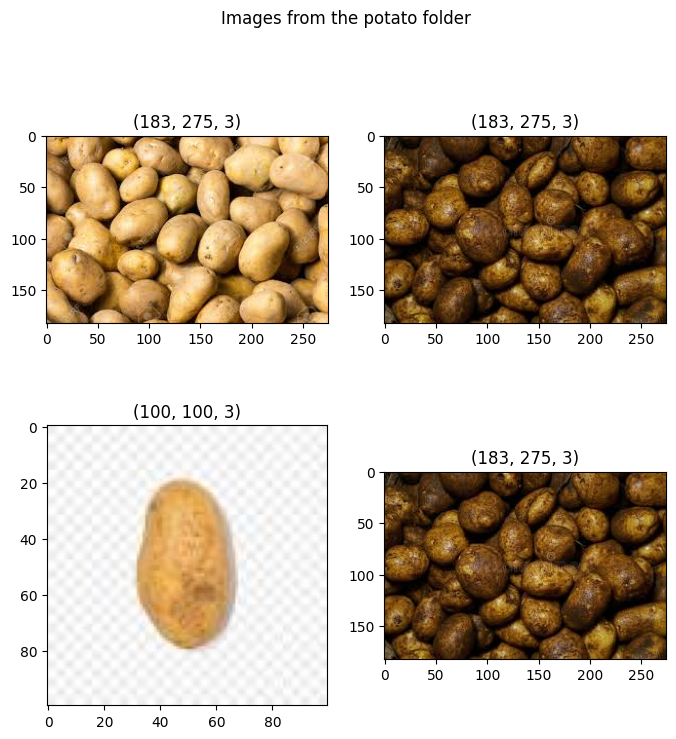

In [10]:
plot_images(train_data_path,"potato","Images from the potato folder")

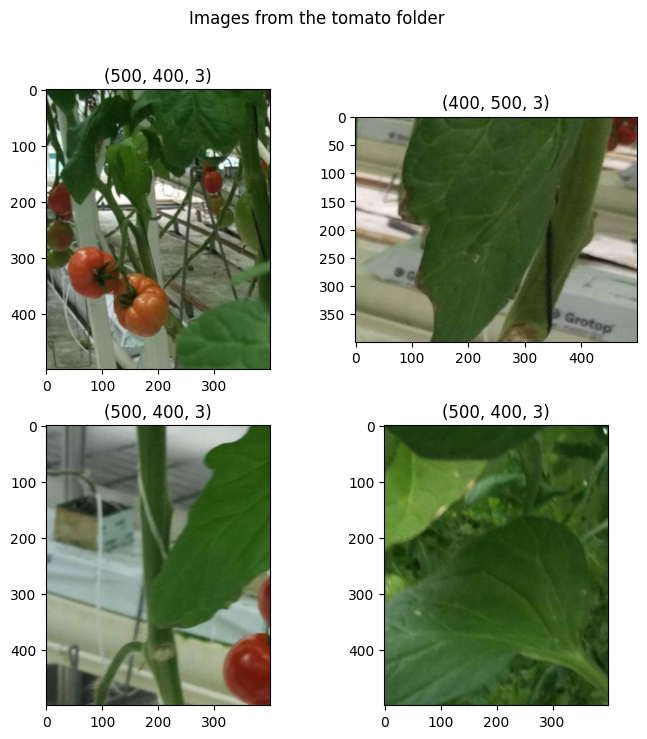

In [11]:
plot_images(train_data_path,"tomato","Images from the tomato folder")

# Ploting Images from Test Folder

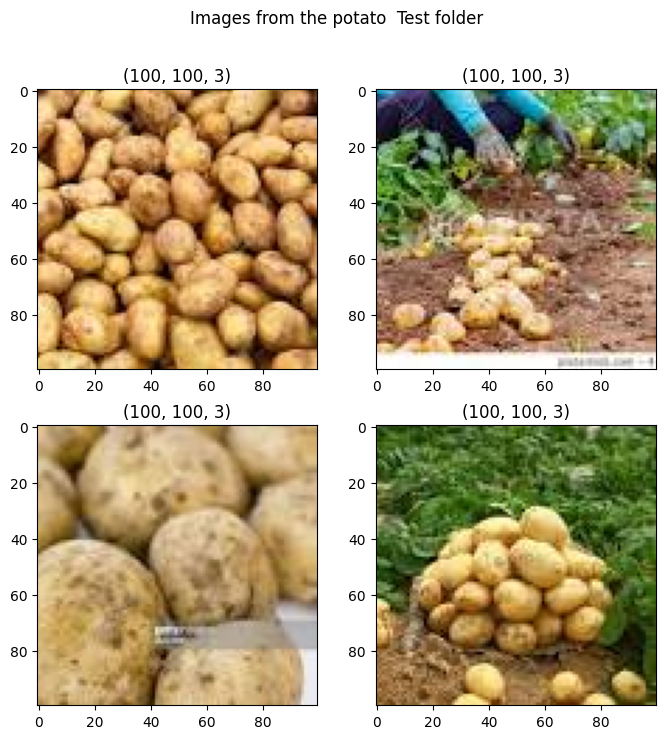

In [12]:
plot_images(test_data_path,"potato","Images from the potato  Test folder")

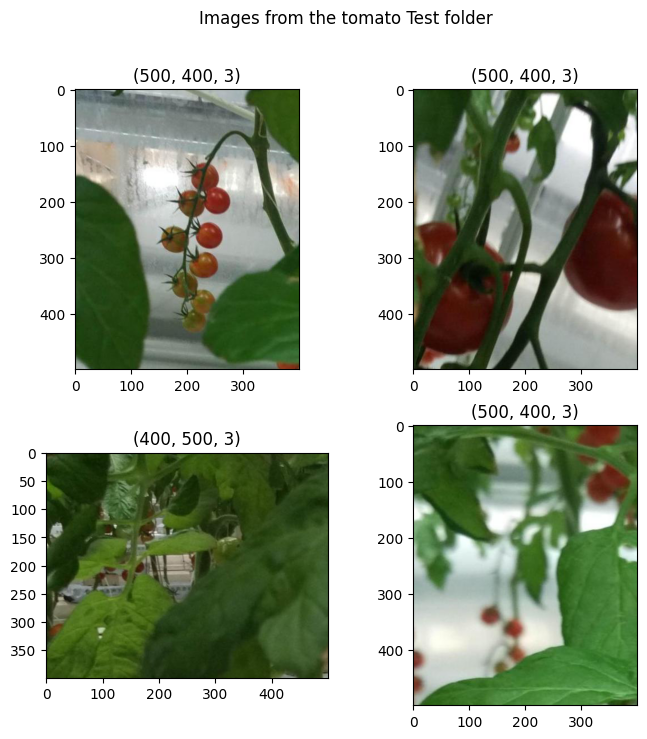

In [13]:
plot_images(test_data_path,"tomato","Images from the tomato Test folder")

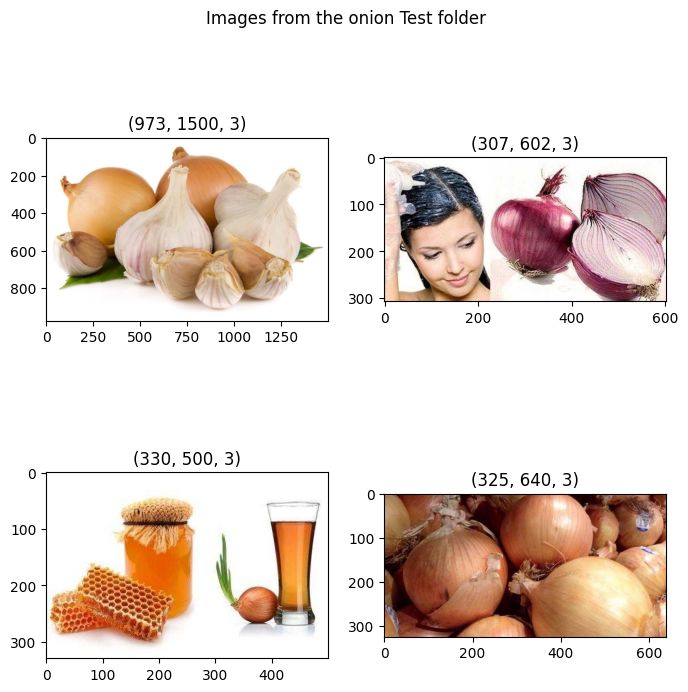

In [14]:
plot_images(test_data_path,"onion","Images from the onion Test folder")

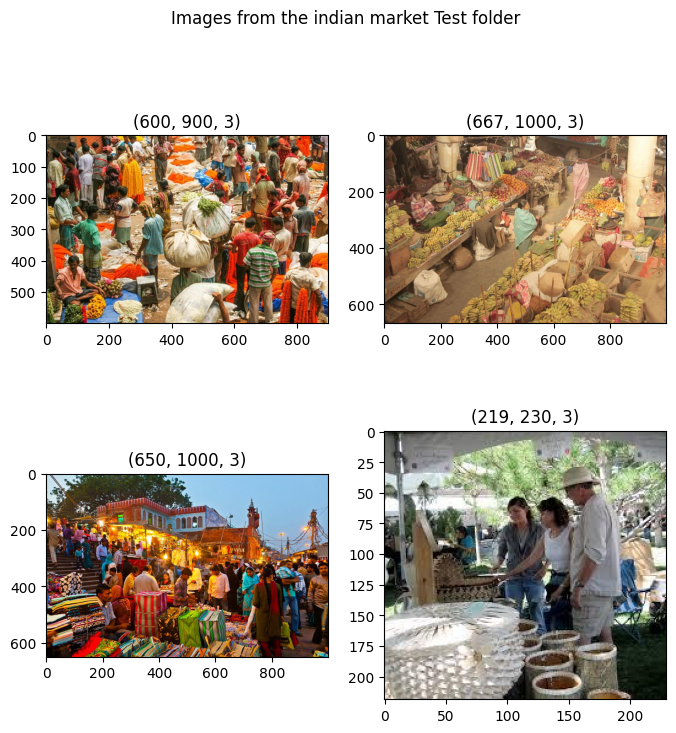

In [15]:
plot_images(test_data_path,"indian market","Images from the indian market Test folder")

# Loading Training and Test Data 

In [16]:
input_shape = (128,128)
train_data = tf.keras.utils.image_dataset_from_directory(train_data_path,image_size=input_shape,batch_size=64,)
test_data = tf.keras.utils.image_dataset_from_directory(test_data_path,image_size=input_shape,batch_size=64)

Found 3135 files belonging to 4 classes.
Found 351 files belonging to 4 classes.


In [17]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Rescaling,RandomFlip,RandomTranslation,RandomRotation,RandomZoom,RandomContrast,RandomBrightness

# Data Preprocessing and Data augumentation

In [18]:
preproces_image = Sequential([
    Rescaling(scale=1./255)
])

In [19]:
train_data = train_data.map(lambda x,y : (preproces_image(x,training=True),y),num_parallel_calls = tf.data.AUTOTUNE)
test_data = test_data.map(lambda x,y : (preproces_image(x,training=True),y),num_parallel_calls = tf.data.AUTOTUNE)

In [20]:
len(train_data)

49

In [21]:
# image_augumentation = Sequential([
#     RandomFlip("horizontal"),
#     RandomFlip("vertical"),
#     RandomRotation(factor=0.5),
#     RandomZoom(height_factor=-0.1,width_factor=-0.1)
# ])

In [22]:
# train_ds = train_data.map(lambda x,y : (image_augumentation(x,training=True),y),num_parallel_calls =tf.data.AUTOTUNE)

In [23]:
val_data = train_data.take(15)
train_ds = train_data.skip(15)
print(tf.data.experimental.cardinality(train_ds))

tf.Tensor(34, shape=(), dtype=int64)


In [24]:
images,label = next(iter(train_ds))

In [25]:
reference_mapping_label = {
    2:'potato',
    3:'tomato',
    0:'indian market',
    1:'onion'
}

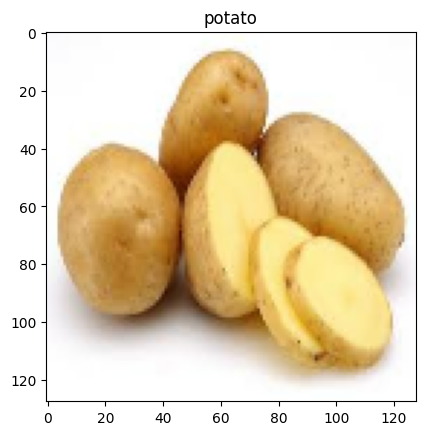

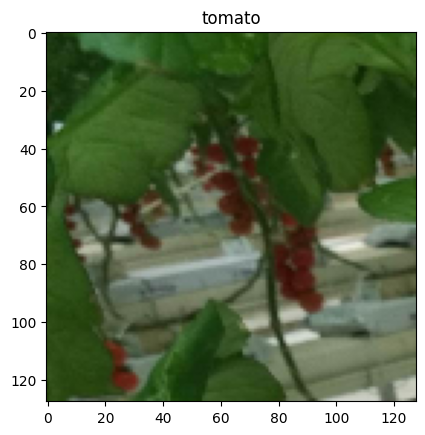

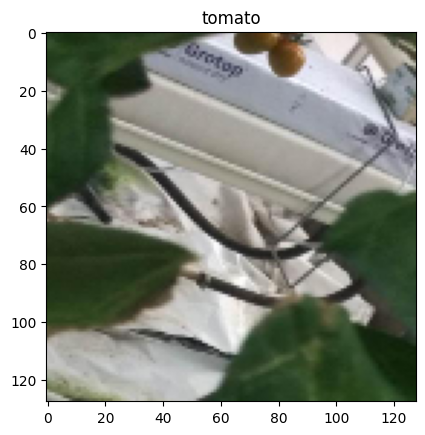

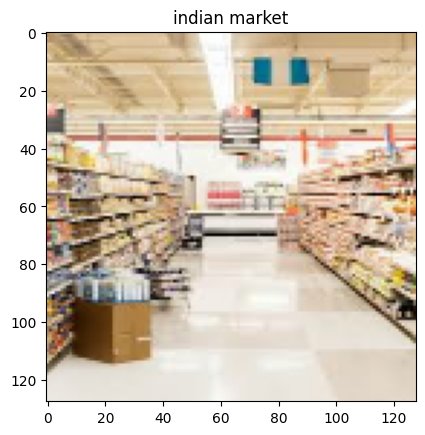

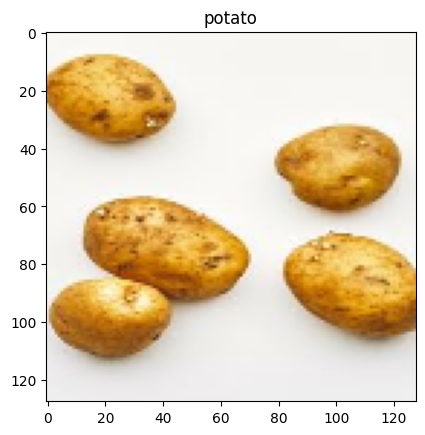

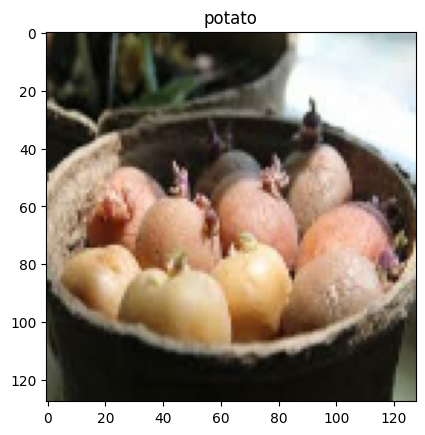

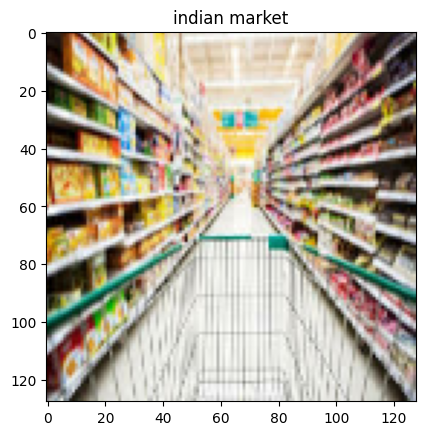

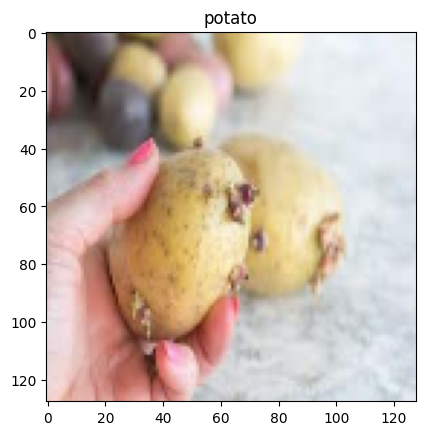

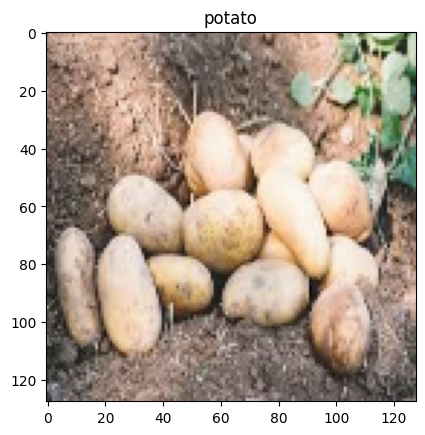

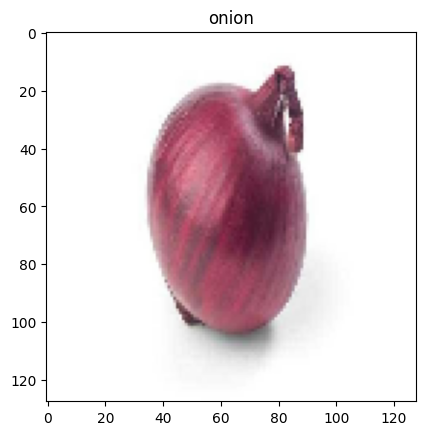

In [26]:
for img,label in zip(images.numpy()[:10],label.numpy()[:10]):
    plt.title(reference_mapping_label[label])
   # plt.title(label)
    plt.imshow(img)
    plt.show()

# Scratch Implementation of CNN Model

In [27]:
from tensorflow.keras.layers import Conv2D,Dropout,BatchNormalization,MaxPooling2D,GlobalAveragePooling2D, Dense
from tensorflow.keras import regularizers

In [28]:
input_shape = (128, 128, 3)
model = Sequential([

    Conv2D(filters=16,kernel_size=3,activation='relu',padding="same",input_shape=input_shape),
    Conv2D(filters=16,kernel_size=3,activation='relu'),
    Dropout(0.2),

    Conv2D(filters=32,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    Conv2D(filters=32,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    MaxPooling2D(),
    Dropout(0.2),

    Conv2D(filters=64,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    Conv2D(filters=64,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    MaxPooling2D(),
    Dropout(0.3),
    
    Conv2D(filters=128,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    Conv2D(filters=128,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    MaxPooling2D(),
    Dropout(0.2),

    Conv2D(filters=256,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    Conv2D(filters=256,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    MaxPooling2D(),
    Dropout(0.2),

    Conv2D(filters=512,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    Conv2D(filters=512,kernel_size=3,activation='relu',padding="same",kernel_regularizer=regularizers.L2(1e-4)),
    MaxPooling2D(),
    Dropout(0.2),

    GlobalAveragePooling2D(),

    Dense(units=4,activation='softmax')

])

In [29]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 conv2d_1 (Conv2D)           (None, 126, 126, 16)      2320      
                                                                 
 dropout (Dropout)           (None, 126, 126, 16)      0         
                                                                 
 conv2d_2 (Conv2D)           (None, 126, 126, 32)      4640      
                                                                 
 conv2d_3 (Conv2D)           (None, 126, 126, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                      

In [30]:
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

In [31]:
model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
filepath = "C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models//"
callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss", factor=0.3, patience=3, min_lr=0.00001
        ),
        tf.keras.callbacks.ModelCheckpoint(filepath, monitor='val_accuracy', mode='max', save_best_only=True),
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss", patience=3, min_delta=0.001, mode='min'
        )
    ]

In [32]:
tf.keras.backend.clear_session()

In [33]:
hist = model.fit(train_ds,validation_data=val_data,verbose=1,epochs=60,batch_size=32,callbacks=callbacks)

Epoch 1/60


34/34 [==============================] - ETA: 0s - loss: 1.5214 - accuracy: 0.2602

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 48s 749ms/step - loss: 1.5214 - accuracy: 0.2602 - val_loss: 1.4708 - val_accuracy: 0.2677 - lr: 0.0010
Epoch 2/60
34/34 [==============================] - 13s 322ms/step - loss: 1.4558 - accuracy: 0.2717 - val_loss: 1.4456 - val_accuracy: 0.2646 - lr: 0.0010
Epoch 3/60
34/34 [==============================] - ETA: 0s - loss: 1.4217 - accuracy: 0.3149

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 419ms/step - loss: 1.4217 - accuracy: 0.3149 - val_loss: 1.3761 - val_accuracy: 0.4187 - lr: 0.0010
Epoch 4/60
34/34 [==============================] - ETA: 0s - loss: 1.1786 - accuracy: 0.4782

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 427ms/step - loss: 1.1786 - accuracy: 0.4782 - val_loss: 0.9694 - val_accuracy: 0.5344 - lr: 0.0010
Epoch 5/60
34/34 [==============================] - ETA: 0s - loss: 0.9562 - accuracy: 0.5375

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 434ms/step - loss: 0.9562 - accuracy: 0.5375 - val_loss: 1.0074 - val_accuracy: 0.5698 - lr: 0.0010
Epoch 6/60
34/34 [==============================] - ETA: 0s - loss: 0.8803 - accuracy: 0.6106

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 423ms/step - loss: 0.8803 - accuracy: 0.6106 - val_loss: 0.8137 - val_accuracy: 0.6396 - lr: 0.0010
Epoch 7/60
34/34 [==============================] - 12s 323ms/step - loss: 0.8731 - accuracy: 0.6078 - val_loss: 0.8669 - val_accuracy: 0.5948 - lr: 0.0010
Epoch 8/60
34/34 [==============================] - ETA: 0s - loss: 0.7927 - accuracy: 0.6317

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 15s 424ms/step - loss: 0.7927 - accuracy: 0.6317 - val_loss: 0.7682 - val_accuracy: 0.6438 - lr: 0.0010
Epoch 9/60
34/34 [==============================] - ETA: 0s - loss: 0.8032 - accuracy: 0.6487

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 15s 413ms/step - loss: 0.8032 - accuracy: 0.6487 - val_loss: 0.7193 - val_accuracy: 0.6865 - lr: 0.0010
Epoch 10/60
34/34 [==============================] - 12s 318ms/step - loss: 0.7319 - accuracy: 0.6874 - val_loss: 0.7117 - val_accuracy: 0.6750 - lr: 0.0010
Epoch 11/60
34/34 [==============================] - 12s 319ms/step - loss: 0.7138 - accuracy: 0.6947 - val_loss: 0.7320 - val_accuracy: 0.6635 - lr: 0.0010
Epoch 12/60
34/34 [==============================] - ETA: 0s - loss: 0.6973 - accuracy: 0.7140

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 15s 422ms/step - loss: 0.6973 - accuracy: 0.7140 - val_loss: 0.6503 - val_accuracy: 0.7240 - lr: 0.0010
Epoch 13/60
34/34 [==============================] - 12s 321ms/step - loss: 0.6503 - accuracy: 0.7361 - val_loss: 0.6361 - val_accuracy: 0.7146 - lr: 0.0010
Epoch 14/60
34/34 [==============================] - ETA: 0s - loss: 0.7298 - accuracy: 0.6791

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 445ms/step - loss: 0.7298 - accuracy: 0.6791 - val_loss: 0.6884 - val_accuracy: 0.7302 - lr: 0.0010
Epoch 15/60
34/34 [==============================] - 12s 325ms/step - loss: 0.7228 - accuracy: 0.6952 - val_loss: 0.7227 - val_accuracy: 0.6573 - lr: 0.0010
Epoch 16/60
34/34 [==============================] - ETA: 0s - loss: 0.6418 - accuracy: 0.7434

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 424ms/step - loss: 0.6418 - accuracy: 0.7434 - val_loss: 0.5810 - val_accuracy: 0.7688 - lr: 0.0010
Epoch 17/60
34/34 [==============================] - 12s 322ms/step - loss: 0.5671 - accuracy: 0.7770 - val_loss: 0.5846 - val_accuracy: 0.7688 - lr: 0.0010
Epoch 18/60
34/34 [==============================] - 12s 321ms/step - loss: 0.6186 - accuracy: 0.7655 - val_loss: 0.6650 - val_accuracy: 0.7115 - lr: 0.0010
Epoch 19/60
34/34 [==============================] - 12s 319ms/step - loss: 0.5816 - accuracy: 0.7623 - val_loss: 0.5665 - val_accuracy: 0.7656 - lr: 0.0010
Epoch 20/60
34/34 [==============================] - ETA: 0s - loss: 0.5385 - accuracy: 0.7926

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 428ms/step - loss: 0.5385 - accuracy: 0.7926 - val_loss: 0.5301 - val_accuracy: 0.7865 - lr: 0.0010
Epoch 21/60
34/34 [==============================] - 13s 325ms/step - loss: 0.5324 - accuracy: 0.7949 - val_loss: 0.5746 - val_accuracy: 0.7635 - lr: 0.0010
Epoch 22/60
34/34 [==============================] - ETA: 0s - loss: 0.5277 - accuracy: 0.7954

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 16s 436ms/step - loss: 0.5277 - accuracy: 0.7954 - val_loss: 0.5222 - val_accuracy: 0.7969 - lr: 0.0010
Epoch 23/60
34/34 [==============================] - 12s 324ms/step - loss: 0.5017 - accuracy: 0.8138 - val_loss: 0.5512 - val_accuracy: 0.7760 - lr: 0.0010
Epoch 24/60
34/34 [==============================] - ETA: 0s - loss: 0.4697 - accuracy: 0.8166

INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


INFO:tensorflow:Assets written to: C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models\/assets


34/34 [==============================] - 15s 425ms/step - loss: 0.4697 - accuracy: 0.8166 - val_loss: 0.4552 - val_accuracy: 0.8229 - lr: 0.0010
Epoch 25/60
34/34 [==============================] - 12s 324ms/step - loss: 0.4388 - accuracy: 0.8271 - val_loss: 0.4619 - val_accuracy: 0.8188 - lr: 0.0010
Epoch 26/60
34/34 [==============================] - 12s 323ms/step - loss: 0.4498 - accuracy: 0.8230 - val_loss: 0.4773 - val_accuracy: 0.8052 - lr: 0.0010
Epoch 27/60
34/34 [==============================] - 12s 323ms/step - loss: 0.4444 - accuracy: 0.8221 - val_loss: 0.5372 - val_accuracy: 0.8156 - lr: 0.0010


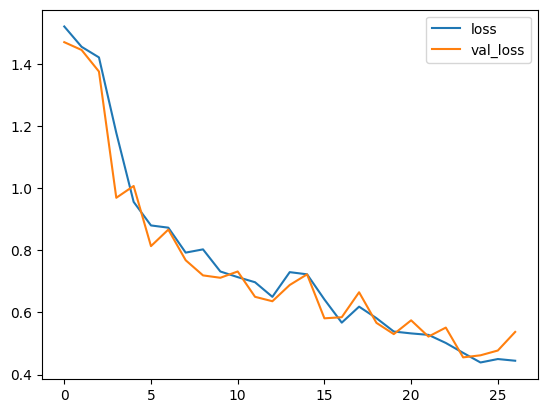

In [34]:
plt.plot(hist.history['loss'],label='loss')
plt.plot(hist.history['val_loss'],label='val_loss')
plt.legend()
plt.show()

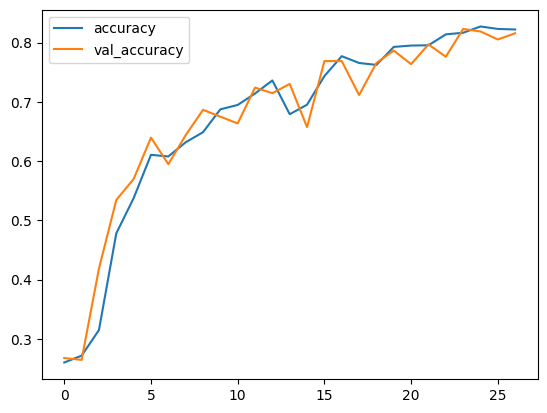

In [35]:
plt.plot(hist.history['accuracy'],label='accuracy')
plt.plot(hist.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.show()

In [36]:
load_model = tf.keras.models.load_model('C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Models')

In [37]:
# Evaluate the model
loss, acc = load_model.evaluate(test_data, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

6/6 - 4s - loss: 0.5625 - accuracy: 0.7521 - 4s/epoch - 600ms/step
Restored model, accuracy: 75.21%


In [38]:
y_pred = load_model.predict(test_data)

6/6 [==============================] - 1s 55ms/step


In [39]:
pred = np.argmax(y_pred,axis=1)

In [40]:
ytest = []
for img,label in test_data:
    labels = label.numpy()
    ytest.extend(labels)

In [41]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

In [42]:
print(classification_report(ytest,pred))

              precision    recall  f1-score   support

           0       0.29      0.23      0.26        81
           1       0.23      0.23      0.23        83
           2       0.20      0.23      0.22        81
           3       0.30      0.30      0.30       106

    accuracy                           0.25       351
   macro avg       0.25      0.25      0.25       351
weighted avg       0.26      0.25      0.25       351



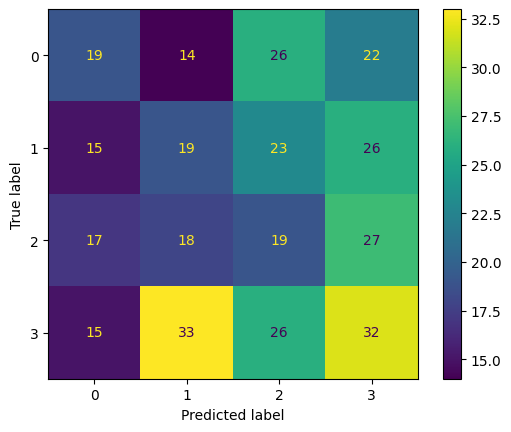

In [43]:
ConfusionMatrixDisplay(confusion_matrix(ytest,pred)).plot()

In [44]:
images,label = next(iter(test_data))
images = images.numpy()
label = label.numpy()

In [45]:
reference_mapping_label = {
    2:'potato',
    3:'tomato',
    0:'indian market',
    1:'onion'
}


In [46]:
CLASS_NAMES = ['indian market','onion','potato','tomato']

2/2 [==============================] - 0s 149ms/step
This image is -200.00 percent indian market
This image is 300.00 percent onion
CPU times: total: 0 ns
Wall time: 0 ns


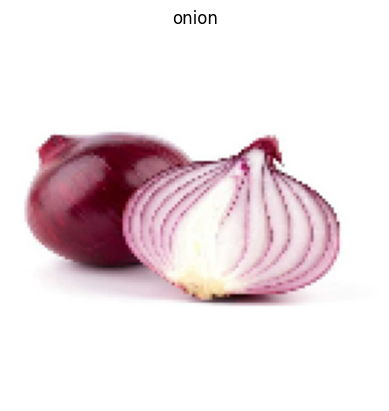

In [47]:
for image, label in test_data.take(2):
      plt.imshow(image[2])
      plt.title(CLASS_NAMES[label[2].numpy()])
      plt.axis('off')
prediction = load_model.predict(test_data.take(2))[2]
prediction = np.argmax(prediction)
#print(prediction)
scores = [1 - prediction, prediction]
for score, name in zip(scores, CLASS_NAMES):
    print("This image is %.2f percent %s" % ((100 * score), name))
%time

1/1 [==============================] - 1s 1s/step


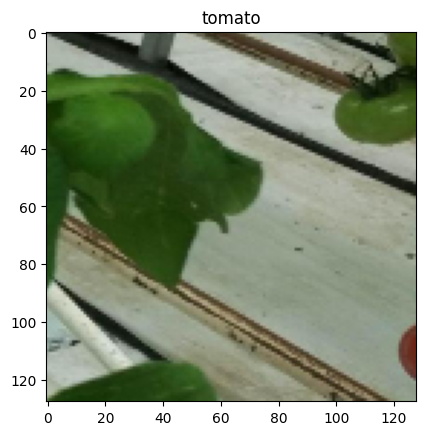

1/1 [==============================] - 0s 34ms/step


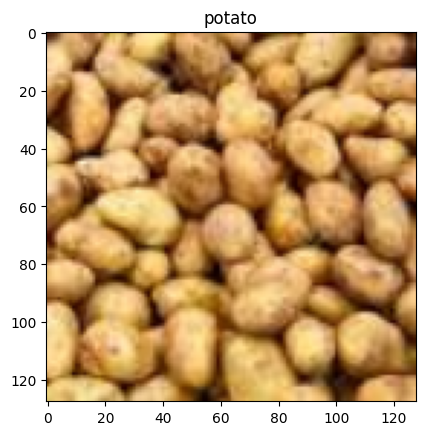

1/1 [==============================] - 0s 31ms/step


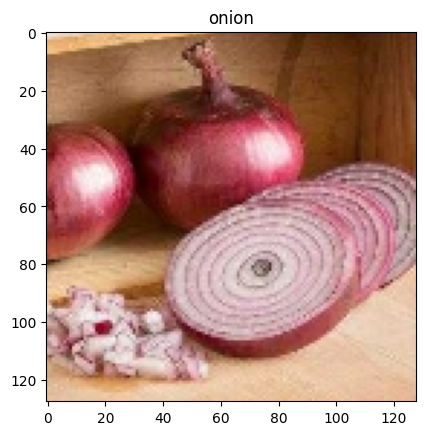

1/1 [==============================] - 0s 40ms/step


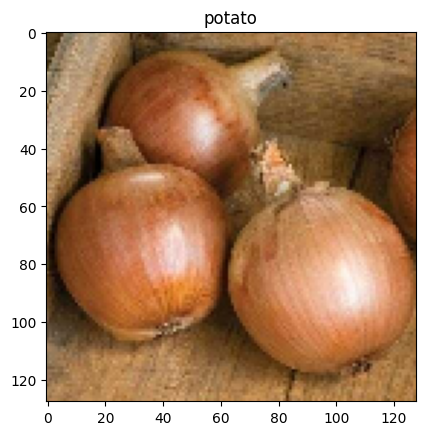

1/1 [==============================] - 0s 40ms/step


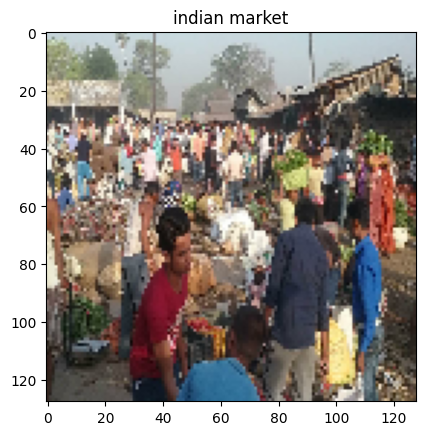

In [48]:
for img in images[:5]:
    #print(img.shape)
    temp = (np.expand_dims(img,axis=0))
    pred = load_model.predict(temp)
    labels = reference_mapping_label[np.argmax(pred)]
    plt.imshow(img)
    plt.title(labels)
    plt.show()

# Applying Transfer Learning Method

In [49]:
base_model = tf.keras.applications.ResNet50(input_shape=(128,128,3),include_top=False,weights='imagenet')

for layers in base_model.layers[-1:-1000:-1]:
    #print(layers,layers.trainable)
    layers.trainable = False

inputs = tf.keras.Input(shape=(128,128,3))
x = base_model(inputs,training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(4,activation='softmax')(x)

n_model = tf.keras.Model(inputs,outputs)

In [50]:
# for layers in base_model.layers:
#     if(layers.trainable == False):
#         print(layers,layers.trainable)

In [51]:
# for layers in base_model.layers:
#     print(layers,layers.trainable)

In [52]:
n_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 4)                 8196      
                                                                 
Total params: 23,595,908
Trainable params: 8,196
Non-trainable params: 23,587,712
_________________________________________________________________


In [53]:
n_model.compile(optimizer=tf.keras.optimizers.Adam(),
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])

filepath = "C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//TL_MODEL"
callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss", factor=0.3, patience=5, min_lr=0.00001
        ),
        tf.keras.callbacks.ModelCheckpoint(filepath, save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
        tf.keras.callbacks.EarlyStopping(
            monitor="val_loss", patience=10, min_delta=0.001, mode='min'
        )
    ]

In [54]:
tf.keras.backend.clear_session()

In [55]:
t_hist = n_model.fit(train_ds,validation_data=val_data,verbose=1,epochs=100,batch_size=32,callbacks=callbacks)

Epoch 1/100
34/34 [==============================] - 14s 247ms/step - loss: 1.3703 - accuracy: 0.2855 - val_loss: 1.3536 - val_accuracy: 0.2865 - lr: 0.0010
Epoch 2/100
34/34 [==============================] - 8s 210ms/step - loss: 1.3423 - accuracy: 0.3131 - val_loss: 1.3322 - val_accuracy: 0.3729 - lr: 0.0010
Epoch 3/100
34/34 [==============================] - 7s 186ms/step - loss: 1.3207 - accuracy: 0.3756 - val_loss: 1.3173 - val_accuracy: 0.3646 - lr: 0.0010
Epoch 4/100
34/34 [==============================] - 8s 196ms/step - loss: 1.3010 - accuracy: 0.3825 - val_loss: 1.3040 - val_accuracy: 0.3625 - lr: 0.0010
Epoch 5/100
34/34 [==============================] - 9s 218ms/step - loss: 1.2878 - accuracy: 0.4014 - val_loss: 1.2867 - val_accuracy: 0.3760 - lr: 0.0010
Epoch 6/100
34/34 [==============================] - 9s 224ms/step - loss: 1.2731 - accuracy: 0.4230 - val_loss: 1.2723 - val_accuracy: 0.3833 - lr: 0.0010
Epoch 7/100
34/34 [==============================] - 8s 214ms/s

In [64]:
# n_model.save('tl_model.pb')

INFO:tensorflow:Assets written to: tl_model.pb\assets


INFO:tensorflow:Assets written to: tl_model.pb\assets


In [65]:
load_model = tf.keras.models.load_model("C://Users//gaura//Documents//GitHub//Scaler-Projects//Computer Vision//Project//Notebook//tl_model.pb")

In [66]:
# Evaluate the model
loss, acc = load_model.evaluate(test_data, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

6/6 - 2s - loss: 1.1665 - accuracy: 0.4644 - 2s/epoch - 338ms/step
Restored model, accuracy: 46.44%


In [67]:
images,label = next(iter(test_data))

1/1 [==============================] - 1s 1s/step


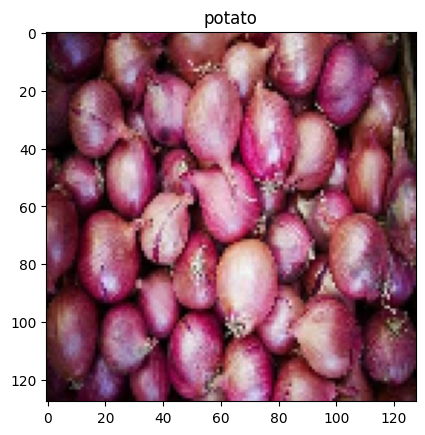

1/1 [==============================] - 0s 33ms/step


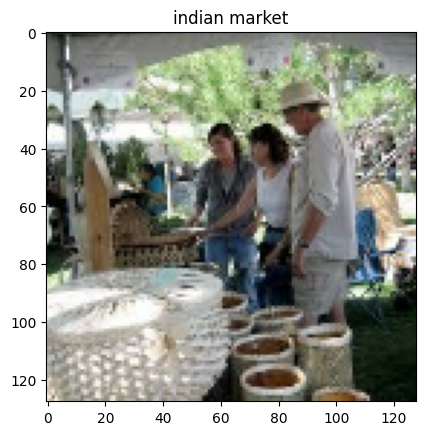

1/1 [==============================] - 0s 24ms/step


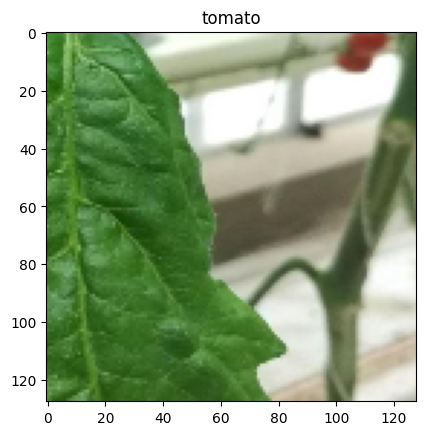

1/1 [==============================] - 0s 26ms/step


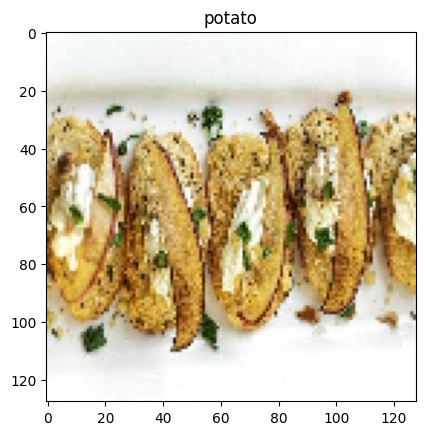

1/1 [==============================] - 0s 32ms/step


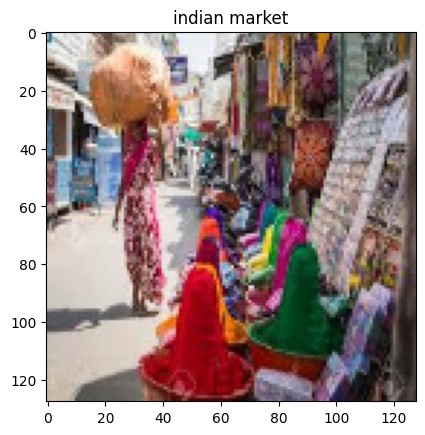

In [68]:
for img in images.numpy()[:5]:
    #print(img.shape)
    temp = (np.expand_dims(img,axis=0))
    pred = load_model.predict(temp)
    labels = reference_mapping_label[np.argmax(pred)]
    plt.imshow(img)
    plt.title(labels)
    plt.show()

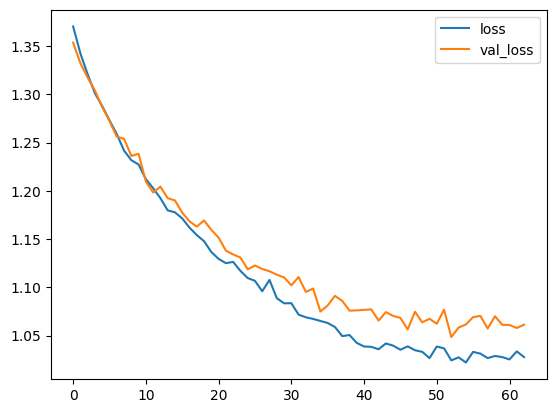

In [69]:
plt.plot(t_hist.history['loss'],label='loss')
plt.plot(t_hist.history['val_loss'],label='val_loss')
plt.legend()
plt.show()

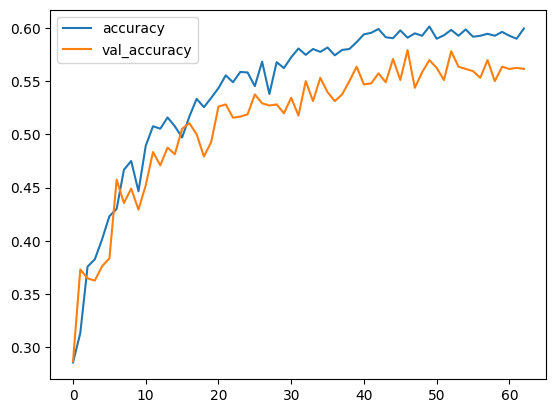

In [70]:
plt.plot(t_hist.history['accuracy'],label='accuracy')
plt.plot(t_hist.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.show()

# Summary of Model

1. Both the model have there own way of generalization.
2. CNN from scratch has achived accuracy of 75.21% but was unable to learn the params and end up with missclassification.
3. Using Transfer learning the model has achived accuracy of 46% accuracy on test but has less missclassification problems.

In [71]:
! pip install nb-pdf-template

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for nb-pdf-template: filename=nb_pdf_template-4.0.0-py3-none-any.whl size=6794 sha256=2b9974e5f8cd09c25fdc7878d5380d9447572157352e135be2c5dec591f47a4a
  Stored in directory: c:\users\gaura\appdata\local\pip\cache\wheels\5c\8c\c4\c70aa7f988af2d421bbd58610f5ae777babda912999bb2acb1
Successfully built nb-pdf-template
